# Breast Cancer Analysis

In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

## Loading Dataset

In [2]:
df=pd.read_csv('data.csv')

## What is the data?

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
df=df.drop('id',axis=1)

In [5]:
df=df.drop('Unnamed: 32',axis=1)

In [6]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [7]:
df.shape

(569, 31)

## More in depth about the data.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [9]:
df.nunique()

diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: int64

In [10]:
df.dtypes

diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

we observe that all the features except diagnosis(target column) are float64(numerical datatype)

In [11]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


## Handling Null and Duplicate values

In [12]:
df=df.drop_duplicates()

In [13]:
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

## Correlation and Heatmap

In [14]:
c=df.corr()

<AxesSubplot:>

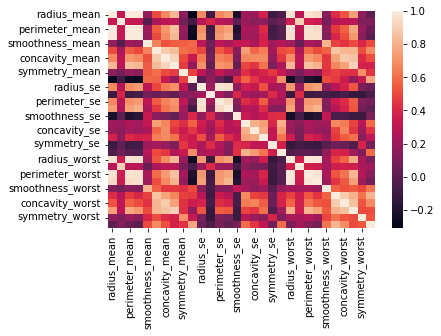

In [15]:
sns.heatmap(c)

## Univariate Analysis

### Categorical Variable Analysis

<AxesSubplot:xlabel='diagnosis', ylabel='count'>

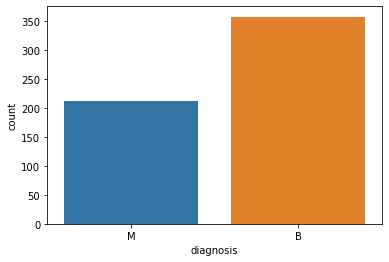

In [16]:
x = df['diagnosis']
sns.countplot(x=x) #x=x is used to follow the updated syntax

<AxesSubplot:>

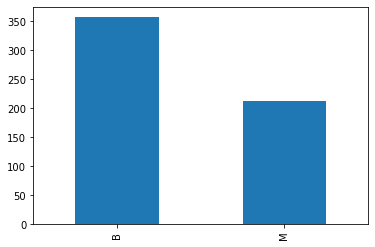

In [17]:
df['diagnosis'].value_counts().plot(kind='bar')

<AxesSubplot:ylabel='diagnosis'>

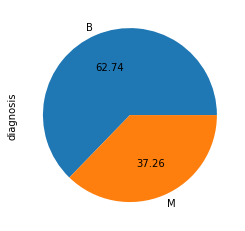

In [18]:
df['diagnosis'].value_counts().plot(kind='pie',autopct='%.2f')#autopct is a attribute or parameter in the 
#function plot to print percentages. .2f is C style syntax to print percentage till only 2 decimal places.

### Numerical Data

Text(0.5, 0, 'Texture Mean')

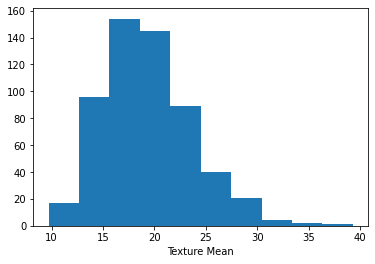

In [19]:
# Histogram
x = df['texture_mean']
plt.hist(x=x)
plt.xlabel("Texture Mean")

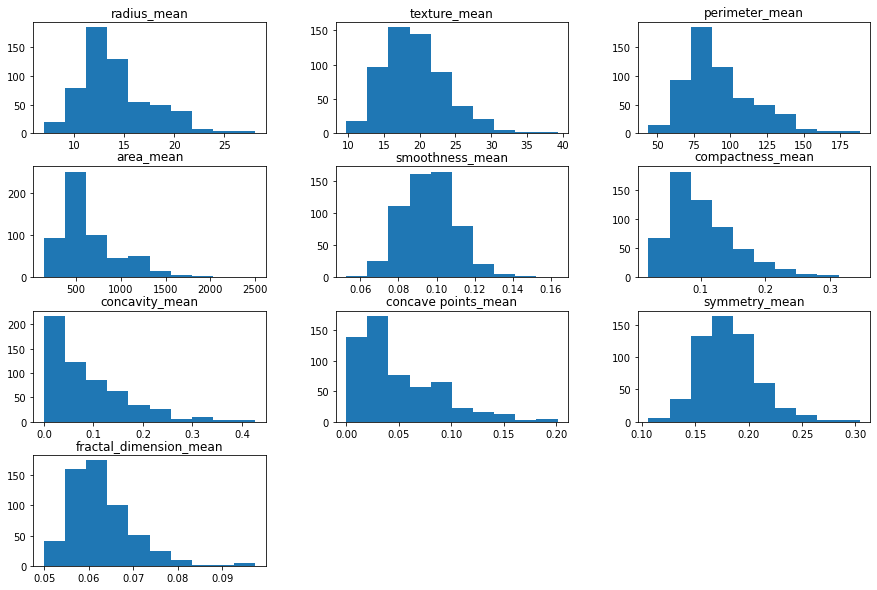

In [20]:
hist_mean=df.iloc[:,1:11].hist(bins=10, figsize=(15, 10),grid=False,)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

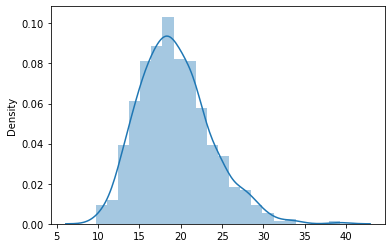

In [21]:
#distplot
x = df['texture_mean']
sns.distplot(x=x)

<AxesSubplot:xlabel='radius_mean'>

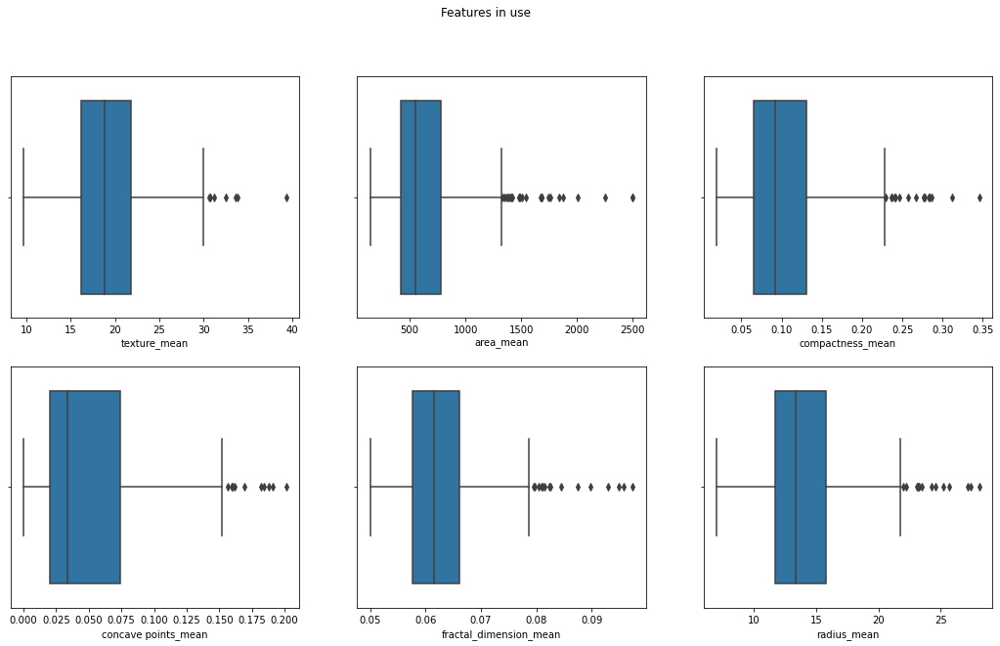

In [22]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
 
fig.suptitle("Features in use")
 
sns.boxplot(ax=axes[0, 0], x=df["texture_mean"])
sns.boxplot(ax=axes[0, 1], x=df["area_mean"])
sns.boxplot(ax=axes[0, 2], x=df["compactness_mean"])
sns.boxplot(ax=axes[1, 0], x=df["concave points_mean"])
sns.boxplot(ax=axes[1, 1], x=df["fractal_dimension_mean"])
sns.boxplot(ax=axes[1, 2], x=df["radius_mean"])

<AxesSubplot:xlabel='radius_mean'>

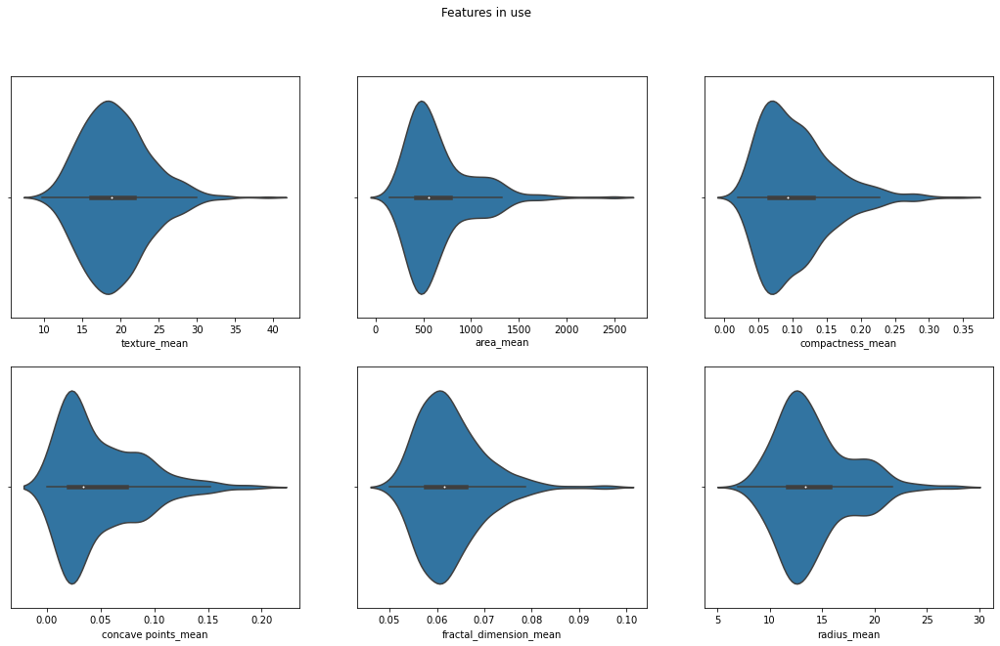

In [23]:
#violinplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
 
fig.suptitle("Features in use")
 
sns.violinplot(ax=axes[0, 0], x=df["texture_mean"])
sns.violinplot(ax=axes[0, 1], x=df["area_mean"])
sns.violinplot(ax=axes[0, 2], x=df["compactness_mean"])
sns.violinplot(ax=axes[1, 0], x=df["concave points_mean"])
sns.violinplot(ax=axes[1, 1], x=df["fractal_dimension_mean"])
sns.violinplot(ax=axes[1, 2], x=df["radius_mean"])

In [24]:
df.skew()

C:\Users\SUJAYD~1\AppData\Local\Temp/ipykernel_6880/1665899112.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew()


radius_mean                0.942380
texture_mean               0.650450
perimeter_mean             0.990650
area_mean                  1.645732
smoothness_mean            0.456324
compactness_mean           1.190123
concavity_mean             1.401180
concave points_mean        1.171180
symmetry_mean              0.725609
fractal_dimension_mean     1.304489
radius_se                  3.088612
texture_se                 1.646444
perimeter_se               3.443615
area_se                    5.447186
smoothness_se              2.314450
compactness_se             1.902221
concavity_se               5.110463
concave points_se          1.444678
symmetry_se                2.195133
fractal_dimension_se       3.923969
radius_worst               1.103115
texture_worst              0.498321
perimeter_worst            1.128164
area_worst                 1.859373
smoothness_worst           0.415426
compactness_worst          1.473555
concavity_worst            1.150237
concave points_worst       0

## Bi Variate or Multivariate Analysis

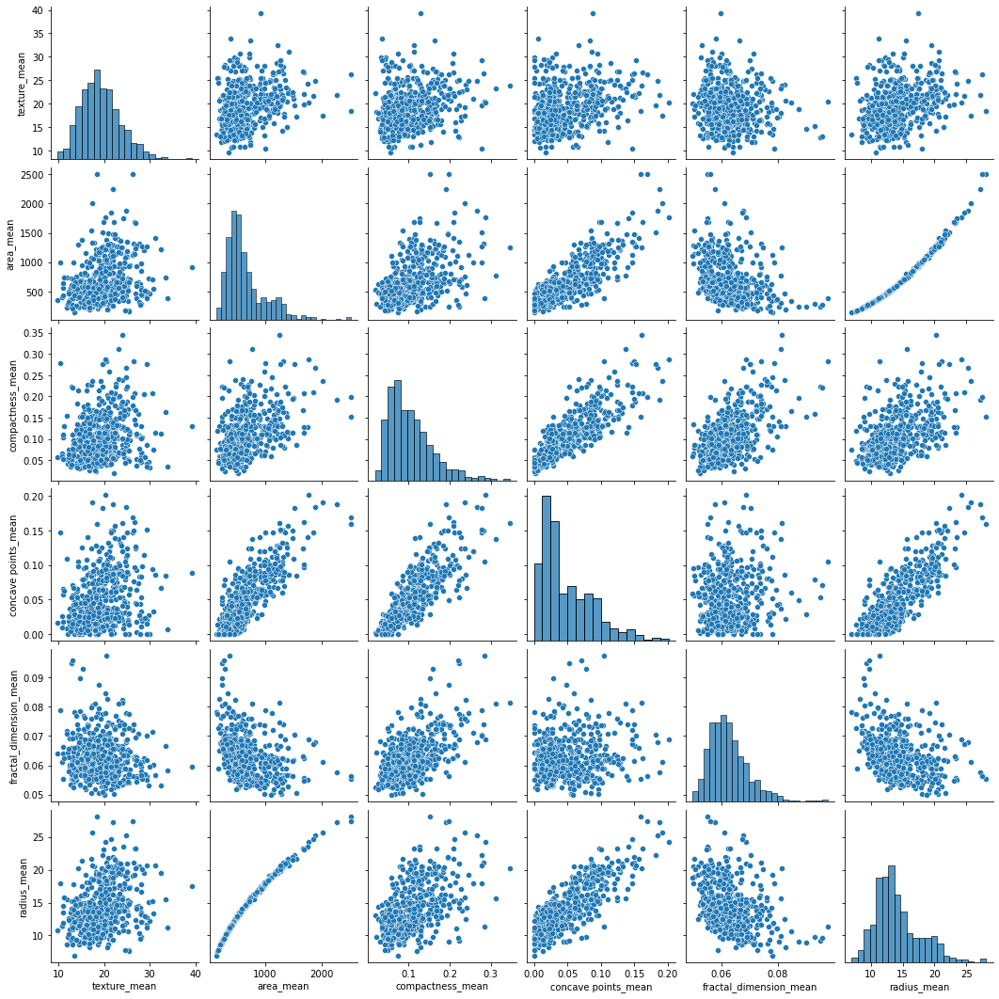

In [25]:
sns.pairplot(df[["texture_mean","area_mean","compactness_mean","concave points_mean","fractal_dimension_mean","radius_mean"]])

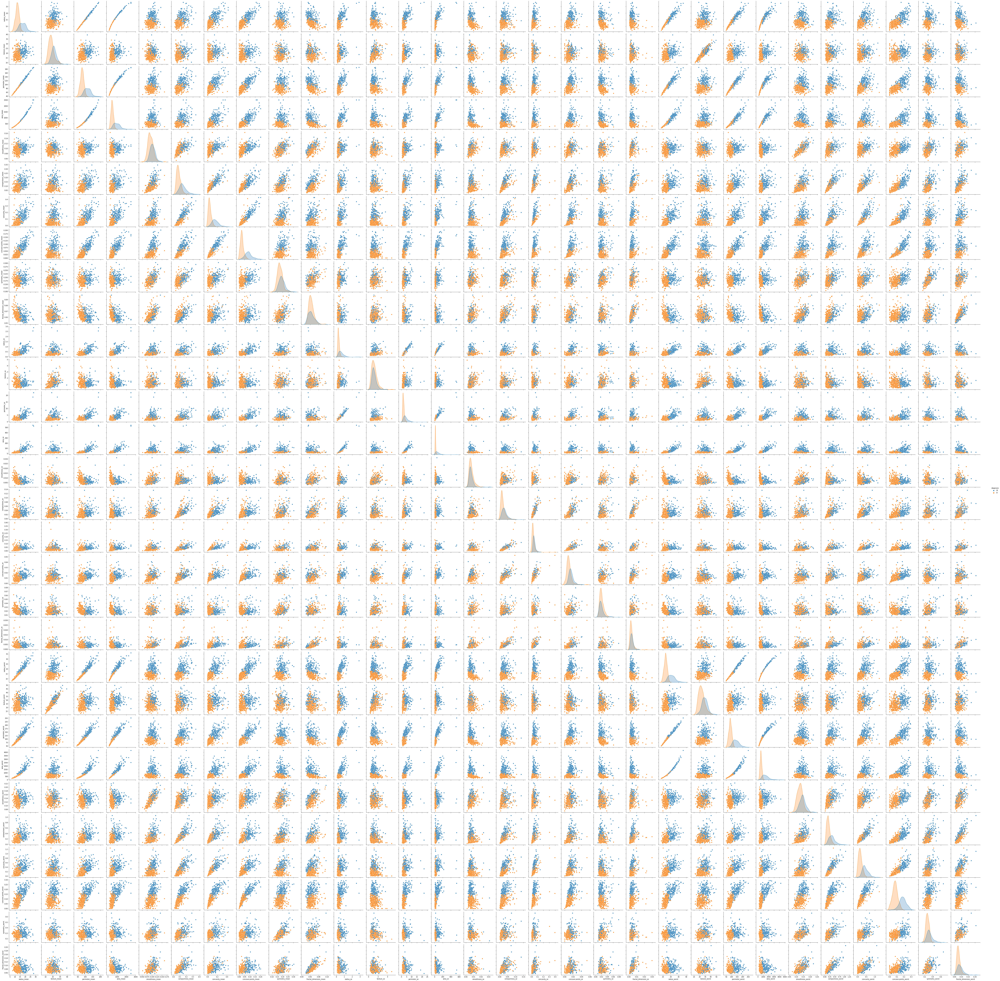

In [26]:
sns.pairplot(df,hue='diagnosis',height=3)

## Handling categorical Variable (Diagnosis)

In [27]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
le.fit(df.diagnosis)
df.diagnosis=le.transform(df.diagnosis)

In [28]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## 80-20 Split

In [29]:
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2)

## Normalization

In [30]:
#performing robust scaling as outliers are present in dataset.
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler().fit(train)
scaler

RobustScaler()

In [31]:
scaler = RobustScaler().fit(test)
scaler

RobustScaler()

In [32]:
train_scaled = scaler.transform(train)
test_scaled = scaler.transform(test)

In [33]:
#converting numpy array into dataframe
train_scaled = pd.DataFrame(train_scaled,columns=train.columns)
test_scaled = pd.DataFrame(test_scaled,columns=test.columns)

In [34]:
train_scaled

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.0,-0.453089,0.215116,-0.425702,-0.423054,0.299654,-0.030289,-0.329638,-0.363809,0.280244,...,-0.278978,0.347532,-0.311487,-0.237106,0.813294,0.420232,0.124937,-0.322132,0.662710,0.455218
1,0.0,-0.909382,-0.927741,-0.795400,-0.805159,1.621009,2.154480,0.632406,0.729298,0.969539,...,-0.711198,-0.771429,-0.760715,-0.589400,2.596285,0.816379,0.187105,0.003091,-0.045500,3.178400
2,0.0,-0.569794,0.446013,-0.567714,-0.518514,0.310712,-0.633456,-0.743580,-0.605901,-0.569191,...,-0.434578,0.358961,-0.509834,-0.383723,-0.234604,-0.631624,-0.837581,-0.793768,0.207715,-0.605603
3,0.0,-0.279176,-0.286545,-0.312693,-0.260586,-1.139461,-1.071556,-0.687649,-0.466379,-1.067015,...,-0.349705,-0.545974,-0.445768,-0.292048,-1.959335,-0.992519,-0.891527,-0.976041,-1.918892,-1.297140
4,0.0,-1.151487,-1.151993,-1.121427,-0.932793,0.074084,-0.755999,-0.597582,-0.672213,-0.332463,...,-0.882986,-1.045714,-1.005958,-0.673633,1.528837,-0.557382,-0.512785,-0.779794,0.690406,0.499347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,1.0,2.647597,1.027409,2.784232,3.463937,0.559502,2.954654,3.326882,3.285034,0.175805,...,2.337917,0.847273,2.884105,2.947631,0.903226,2.183905,1.616164,2.219062,-1.020772,1.361010
451,1.0,1.473684,0.852990,1.557463,1.786080,0.653490,1.519202,2.004071,2.019708,1.637946,...,1.344597,0.411948,1.528477,1.576456,0.019550,0.662227,0.996892,1.051720,0.836795,0.756568
452,0.0,-0.973227,0.490864,-0.941078,-0.814997,-0.911679,-0.620438,-0.387887,-0.732031,-1.756310,...,-0.811002,0.262338,-0.834006,-0.632308,-1.000978,-0.190139,-0.232026,-1.009182,-0.979228,0.603861
453,1.0,1.409611,0.568937,1.400783,1.820647,0.117761,0.111521,0.996931,1.280219,-0.684073,...,1.916699,0.562597,2.246012,2.687963,0.664712,0.525645,1.173368,1.626735,-0.203759,-0.319930


In [35]:
test_scaled

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.0,0.544622,-0.534053,0.594050,0.579406,-0.070214,0.708614,0.652449,0.729970,0.012185,...,0.571316,-0.362078,0.644372,0.585283,0.363636,1.278266,1.006518,1.123443,0.292779,0.556249
1,0.0,-0.116705,0.334718,-0.066672,-0.102107,-0.521355,0.219136,0.503382,-0.060803,-0.753699,...,-0.051081,-0.000519,0.044718,-0.017813,0.035191,0.751771,0.825228,0.134170,-0.609298,0.004645
2,1.0,1.098398,0.529070,1.074090,1.328724,-0.103939,0.014146,0.588563,0.686524,-0.301131,...,1.162279,0.615584,1.190211,1.408621,0.480938,0.029753,0.609044,0.379015,0.470821,-0.322834
3,0.0,-0.672769,0.276578,-0.616051,-0.612644,0.664547,0.566283,0.202493,-0.204804,-0.384682,...,-0.539882,-0.026494,-0.580306,-0.459090,-0.027370,0.185605,0.035095,-0.262776,-0.526212,0.310640
4,1.0,1.427918,0.254983,1.417451,1.698331,0.415757,0.602734,0.911750,1.265215,0.081810,...,1.352456,-0.024416,1.572042,1.497289,0.293255,0.615755,0.697283,0.668377,-0.636993,0.563217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,0.0,0.013730,-0.007475,0.025002,-0.011434,0.164755,0.186158,-0.181198,0.000336,-0.224543,...,-0.002358,0.017143,0.007047,0.002454,0.324536,0.194673,-0.205154,0.261539,-0.043521,0.502250
110,1.0,1.482838,1.582226,1.440787,1.823307,0.089565,0.123671,0.948077,1.345837,-0.092254,...,1.346169,1.328312,1.431097,1.631873,-0.688172,-0.170303,0.308232,0.686926,-0.591494,-0.887792
111,0.0,0.308924,-0.534053,0.315693,0.290368,-0.689426,0.231287,-0.040899,-0.000336,0.356832,...,0.201965,-0.639481,0.385547,0.170764,-0.805474,0.795976,0.383235,0.379015,0.164194,0.113805
112,1.0,1.359268,1.042359,1.324110,1.637173,0.388113,0.042265,1.217399,1.182801,-0.402089,...,0.992534,0.570909,1.041579,1.141036,0.727273,-0.213942,0.613857,0.486598,-1.143422,-1.204819


## Data Exporting

In [36]:
train_scaled.to_csv('train.csv')
test_scaled.to_csv('test.csv')